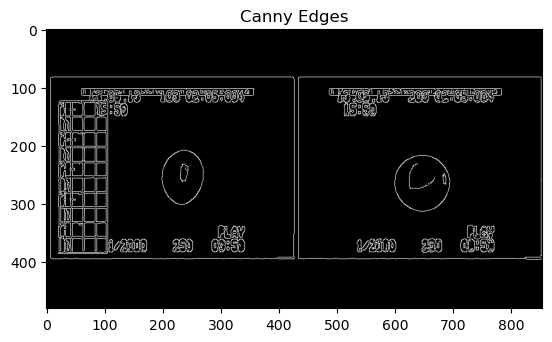

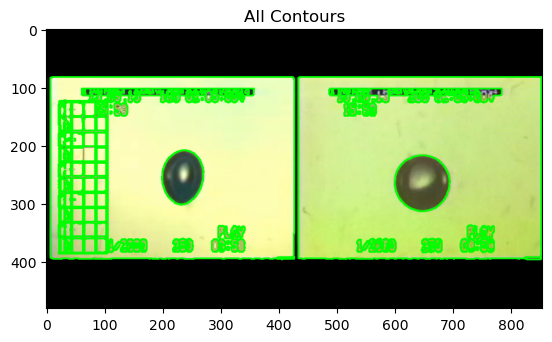

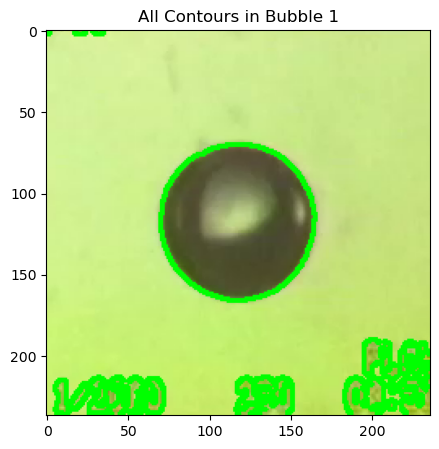

Bubble 1 Largest Areas: [7118.0, 128.5, 91.0]


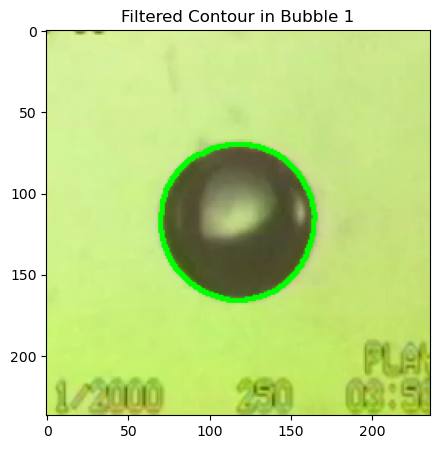

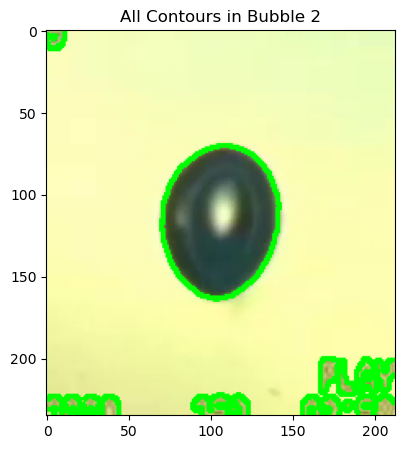

Bubble 2 Largest Areas: [5120.0, 58.0, 20.0]


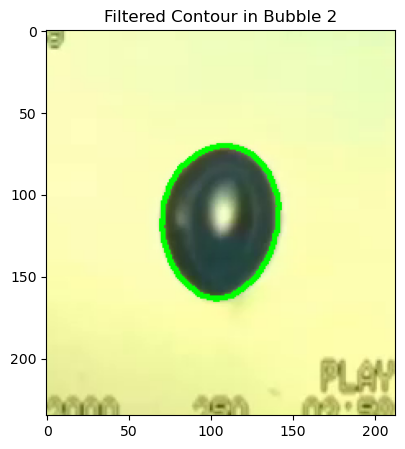

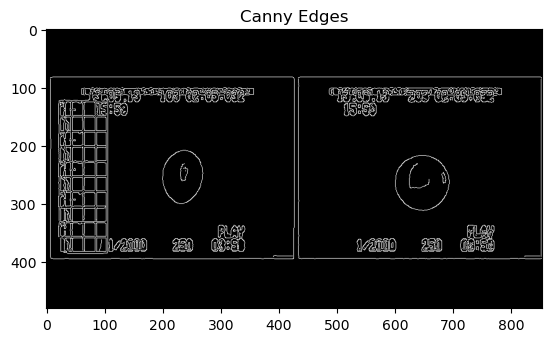

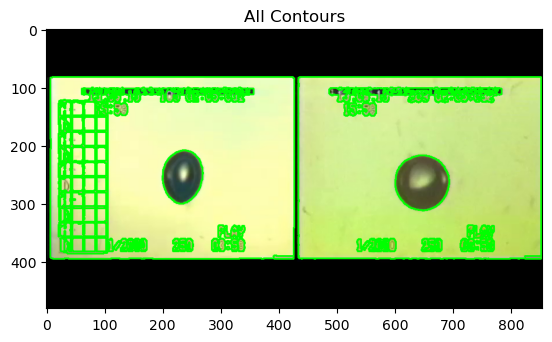

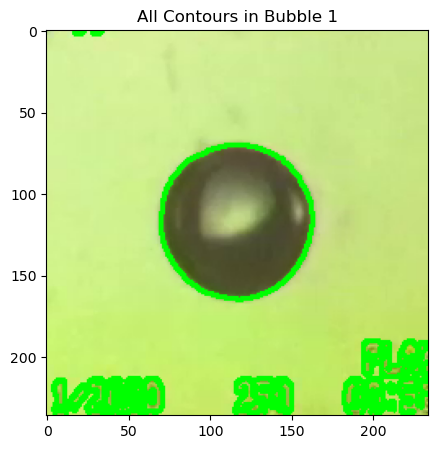

Bubble 1 Largest Areas: [6875.5, 64.5, 41.0]


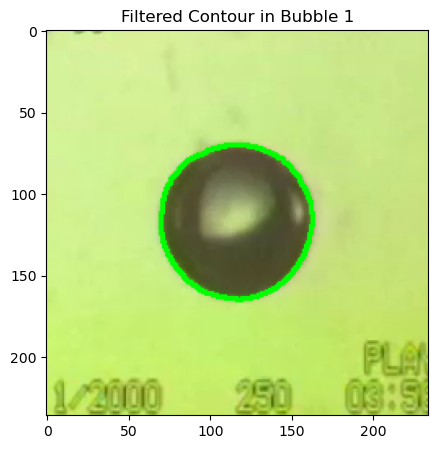

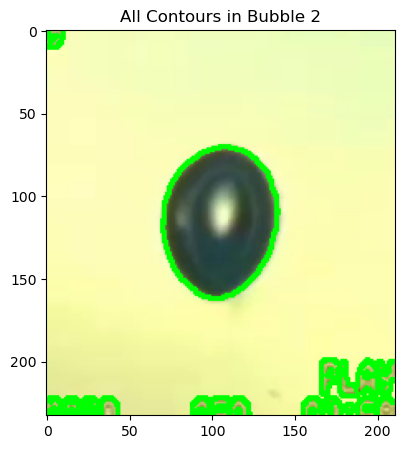

Bubble 2 Largest Areas: [4879.5, 34.0, 19.0]


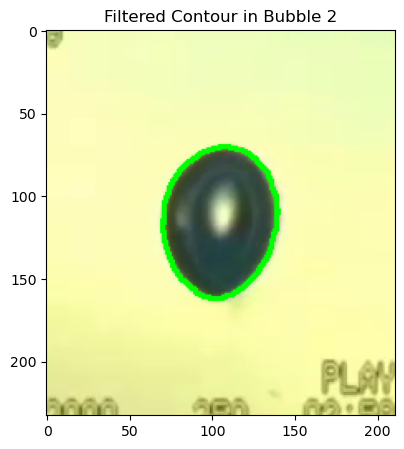

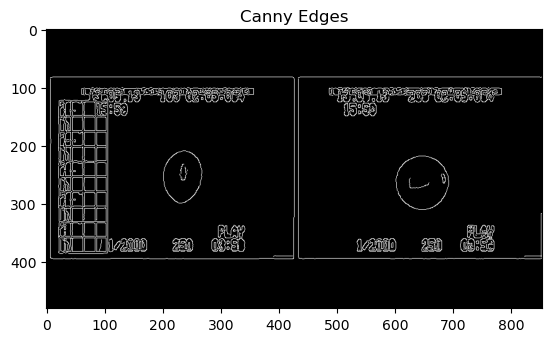

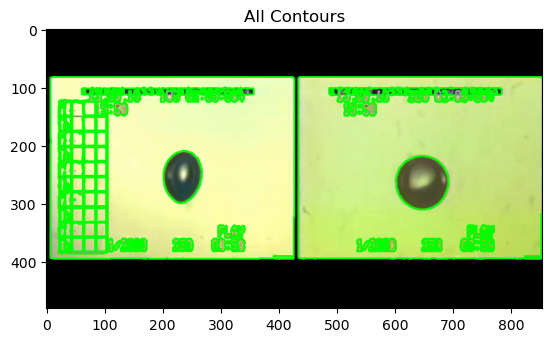

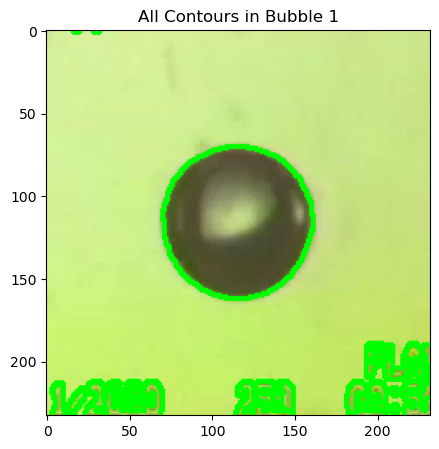

Bubble 1 Largest Areas: [6516.5, 171.5, 54.5]


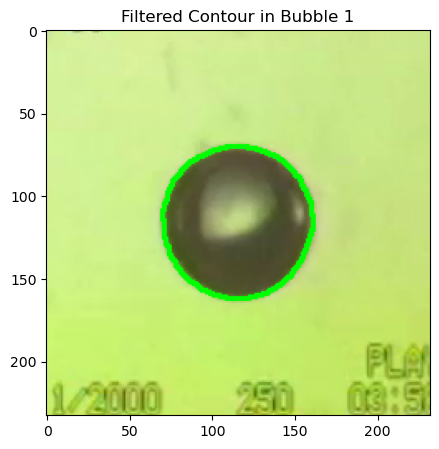

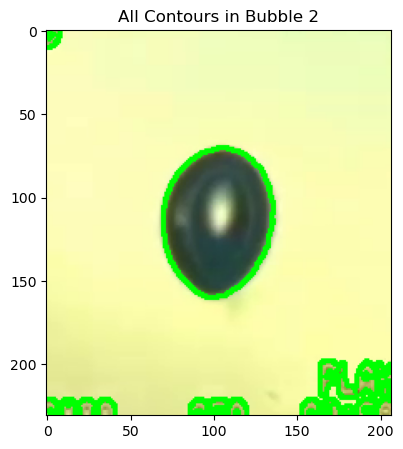

Bubble 2 Largest Areas: [4535.5, 38.0, 34.0]


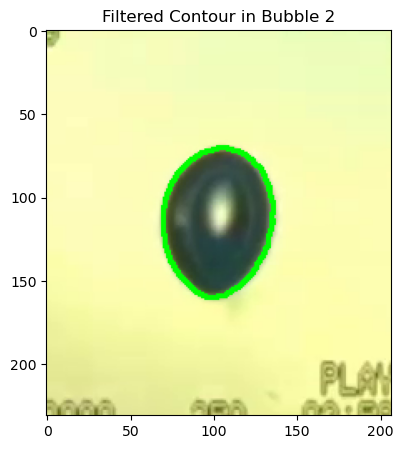

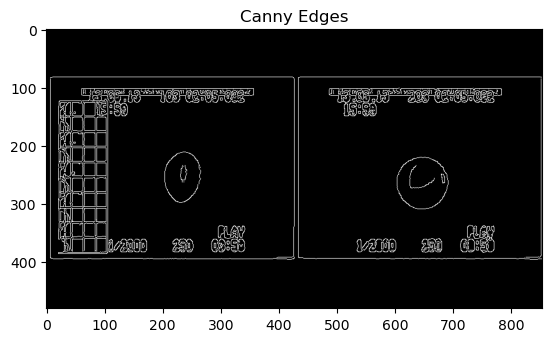

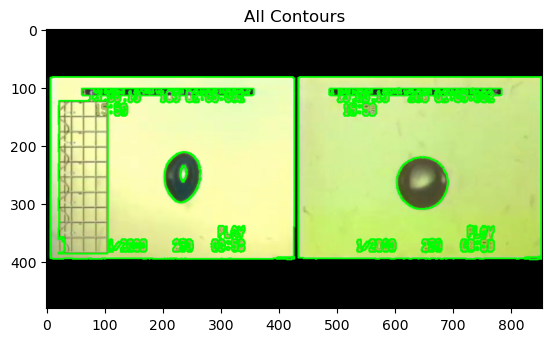

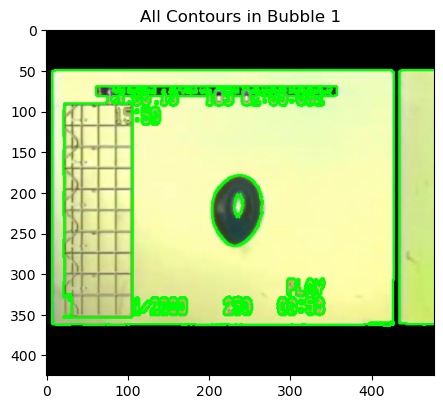

Bubble 1 Largest Areas: [22479.0, 370.0, 352.5]


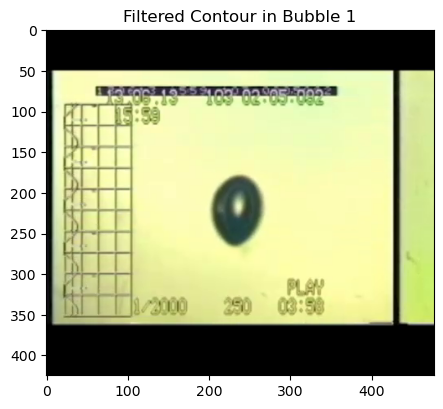

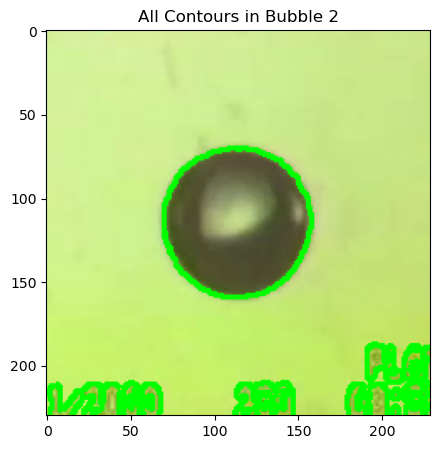

Bubble 2 Largest Areas: [6136.5, 65.5, 35.5]


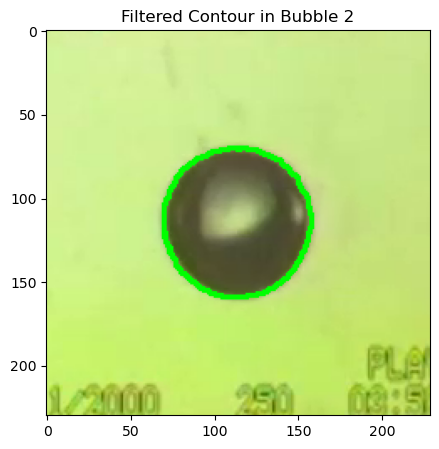

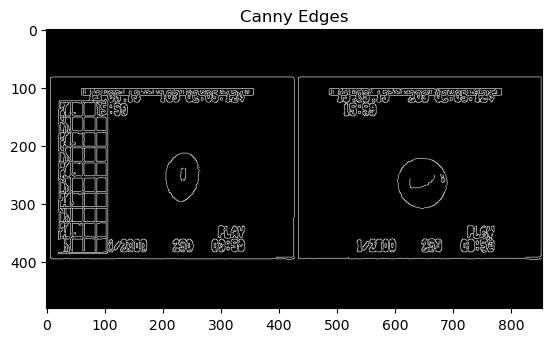

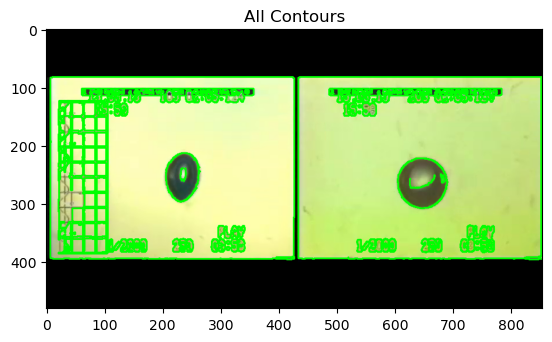

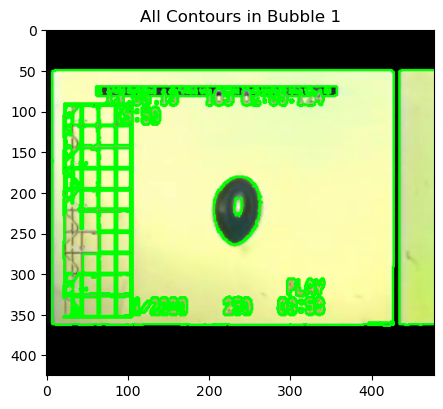

Bubble 1 Largest Areas: [5849.0, 847.5, 707.5]


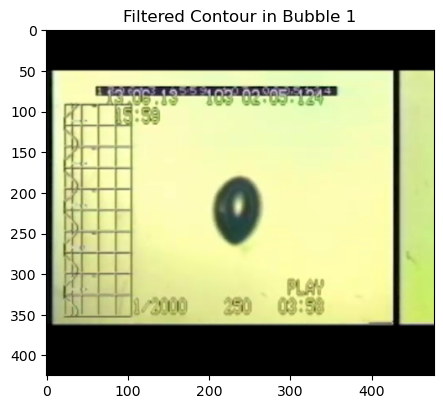

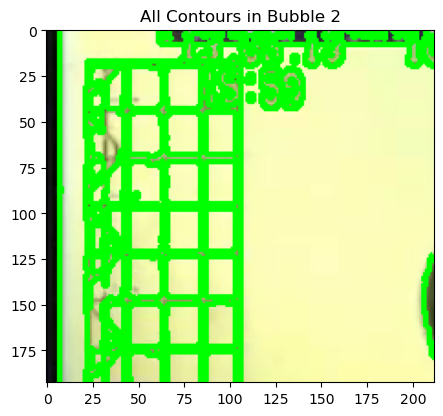

Bubble 2 Largest Areas: [1522.5, 847.5, 707.5]


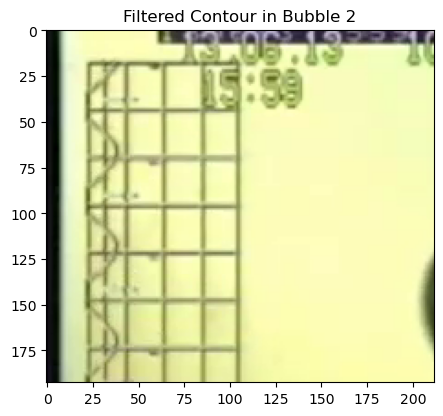

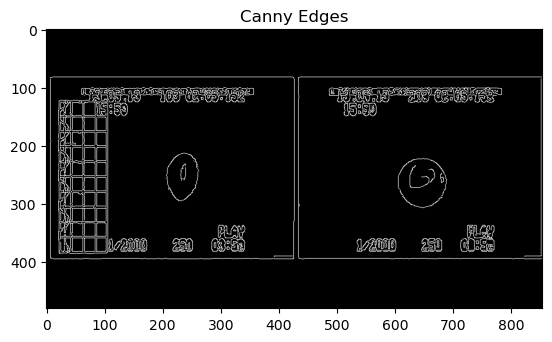

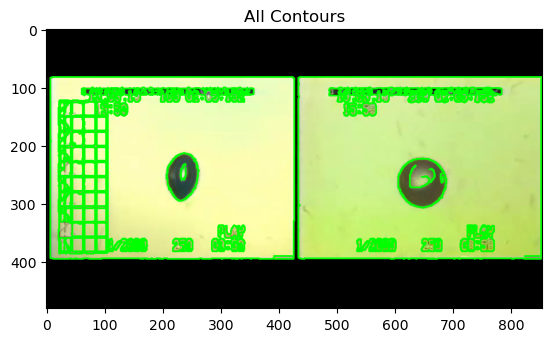

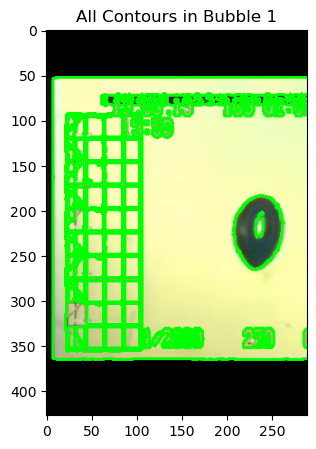

Bubble 1 Largest Areas: [3878.0, 833.0, 737.5]


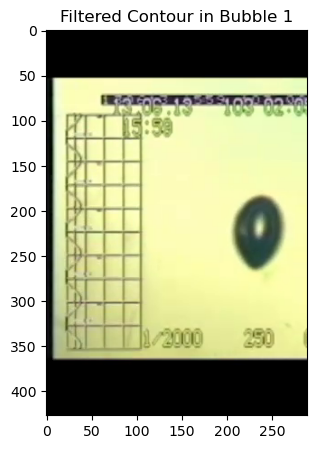

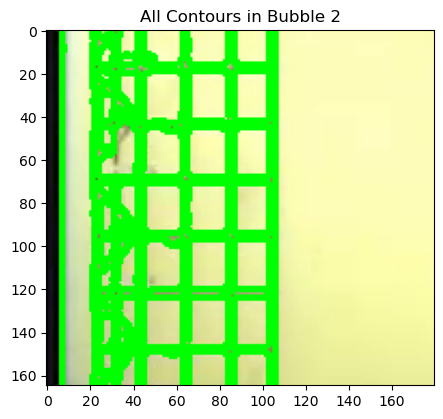

Bubble 2 Largest Areas: [833.0, 634.5, 548.0]


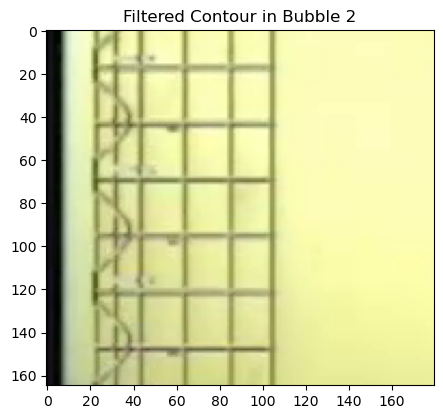

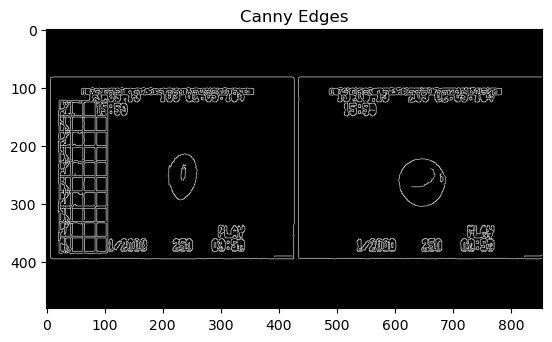

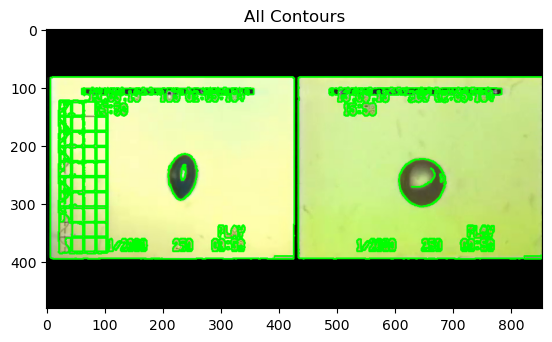

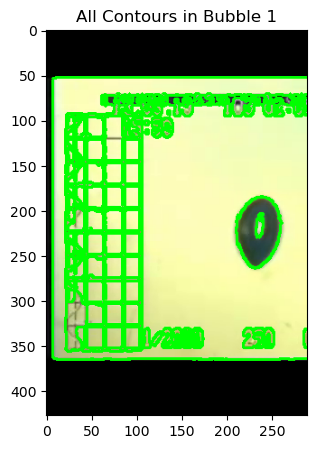

Bubble 1 Largest Areas: [3518.0, 782.0, 742.5]


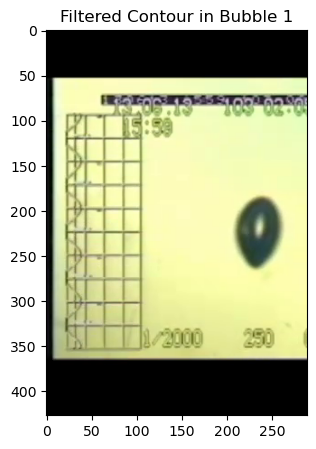

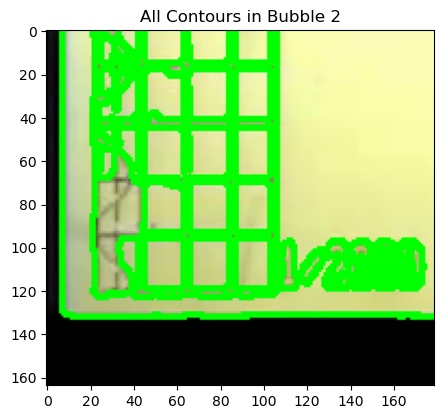

Bubble 2 Largest Areas: [1142.0, 782.0, 421.0]


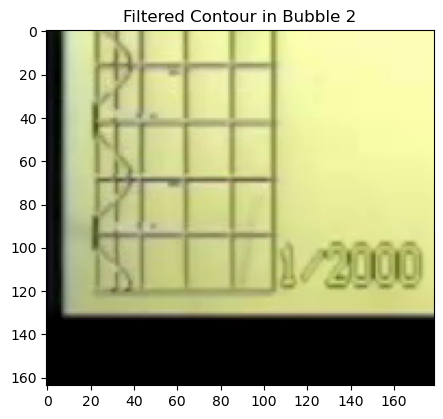

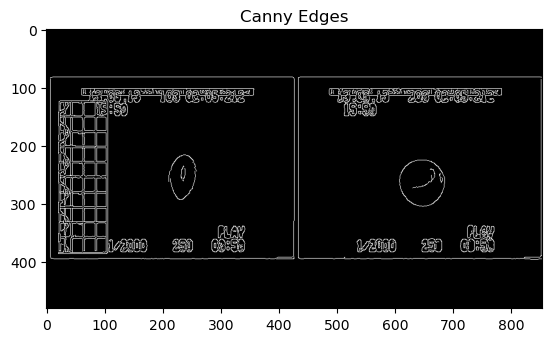

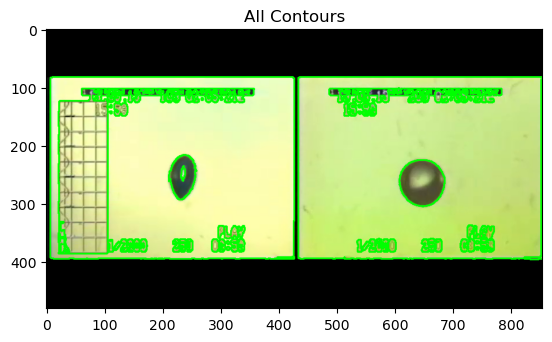

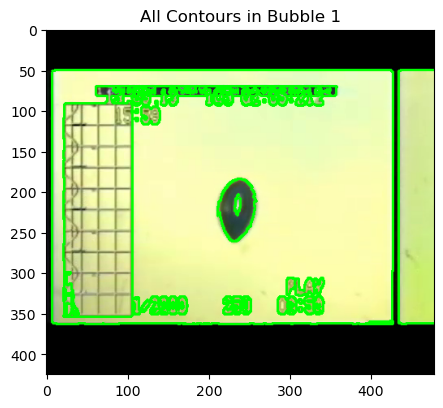

Bubble 1 Largest Areas: [22491.5, 451.0, 381.0]


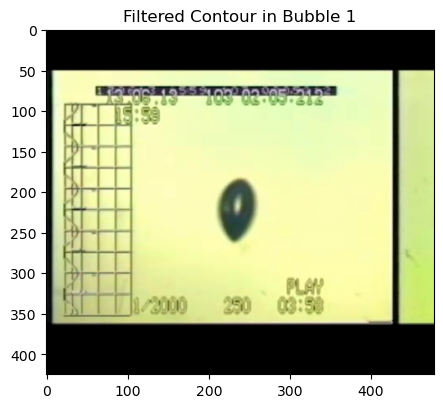

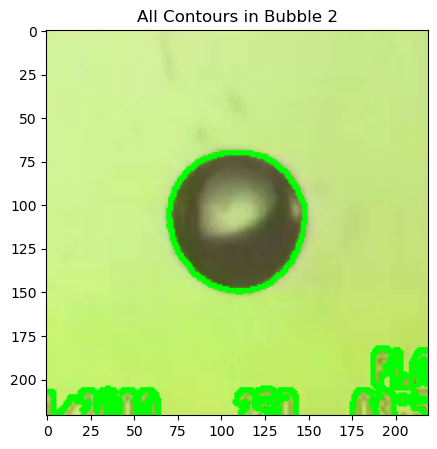

Bubble 2 Largest Areas: [4839.0, 18.5, 18.5]


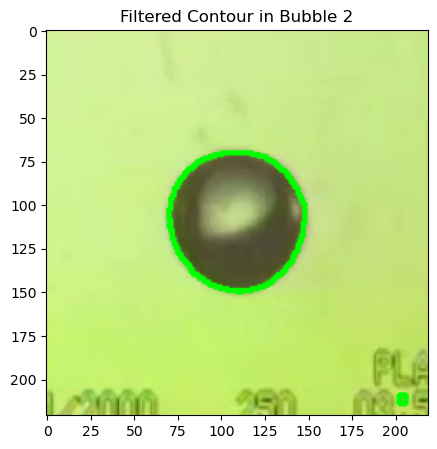

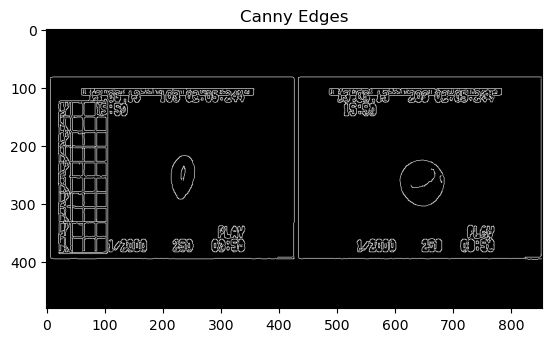

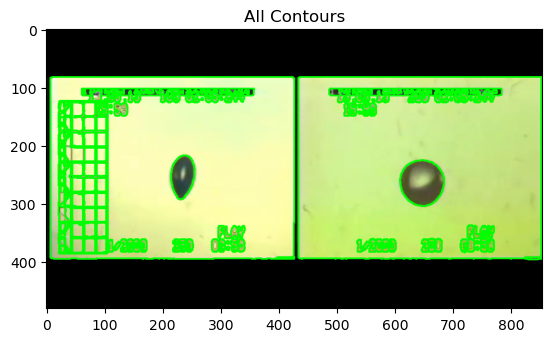

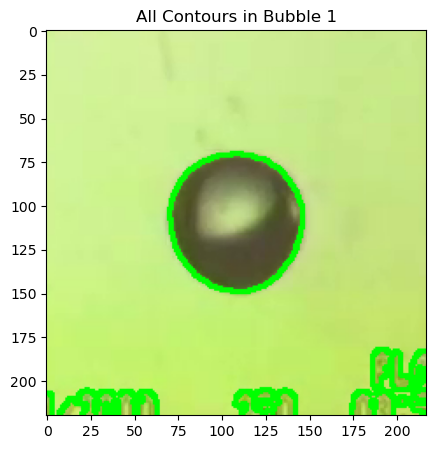

Bubble 1 Largest Areas: [4662.0, 160.5, 22.0]


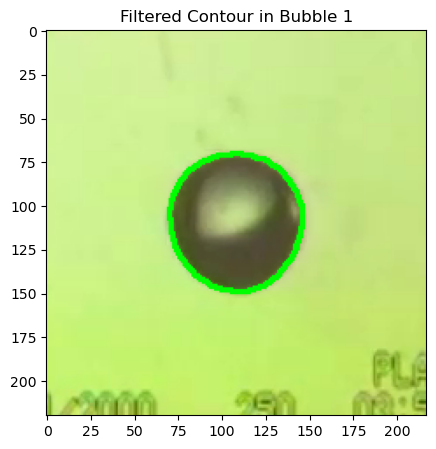

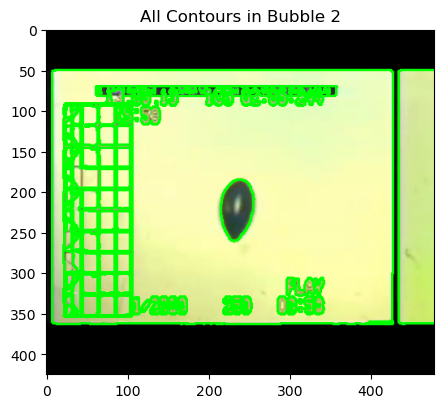

Bubble 2 Largest Areas: [4189.5, 2297.0, 820.0]


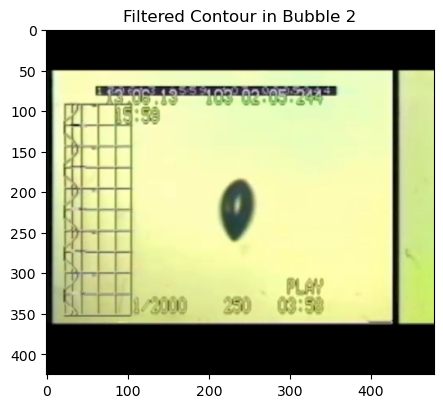

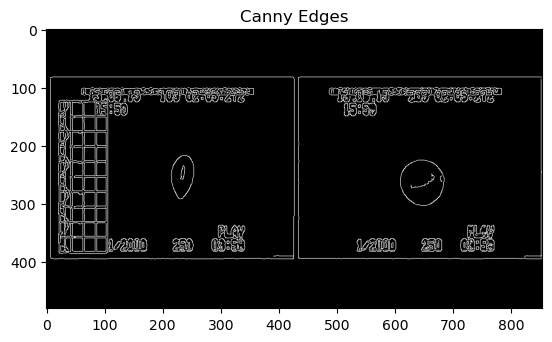

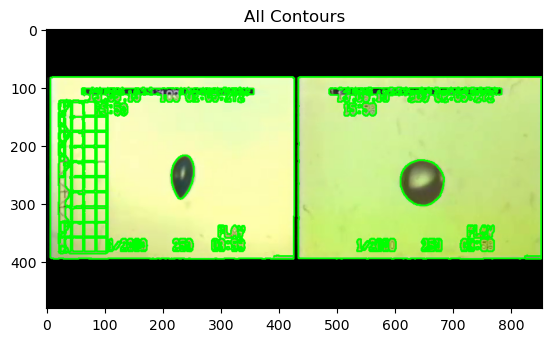

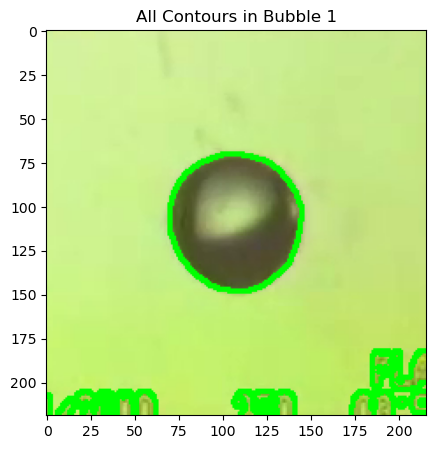

Bubble 1 Largest Areas: [4583.5, 43.0, 17.5]


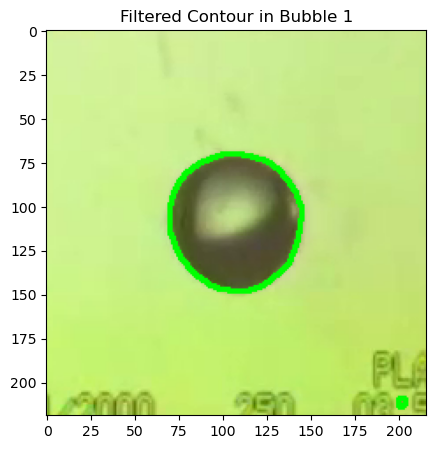

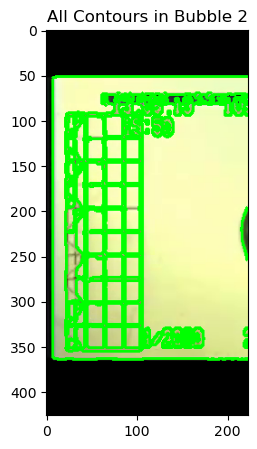

Bubble 2 Largest Areas: [3243.5, 1155.0, 432.0]


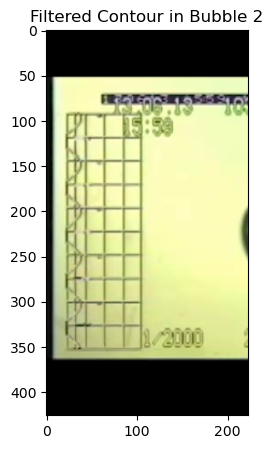

In [40]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

def find_bubbles(frame, margin=70):
    # グレースケール変換
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # ガウシアンフィルタでノイズ除去
    # blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    # 小さなぼかし効果
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)

    # 中程度のぼかし効果
    # blurred = cv2.GaussianBlur(gray, (5, 5), 1)

    # 強いぼかし効果
    # blurred = cv2.GaussianBlur(gray, (9, 9), 2)

    # Cannyエッジ検出
    edged = cv2.Canny(blurred, 30, 150)
    # Cannyエッジ検出の結果を表示
    plt.imshow(edged, cmap='gray')
    plt.title('Canny Edges')
    plt.show()

    # 輪郭検出
    contours, _ = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # すべての輪郭を描画して確認
    all_contours_frame = frame.copy()
    cv2.drawContours(all_contours_frame, contours, -1, (0, 255, 0), 2)
    plt.imshow(cv2.cvtColor(all_contours_frame, cv2.COLOR_BGR2RGB))
    plt.title('All Contours')
    plt.show()


    # 面積が大きい輪郭を見つける
    largest_contours = sorted(contours, key=cv2.contourArea, reverse=True)[:2]  # 最大2つの輪郭を取得

    # 関心領域のリスト
    rois = []

    for contour in largest_contours:
        if cv2.contourArea(contour) > 100:  # 最小面積を設定
            x, y, w, h = cv2.boundingRect(contour)
            # マージンを追加してROIを拡大
            x = max(x - margin, 0)
            y = max(y - margin, 0)
            w = min(w + 2 * margin, frame.shape[1] - x)
            h = min(h + 2 * margin, frame.shape[0] - y)
            roi = frame[y:y+h, x:x+w]
            rois.append(roi)

    return rois

    
def extract_contours_from_roi(roi, num_contours=3):
    """
    関心領域（ROI）から輪郭を検出する関数。
    :param roi: 気泡が含まれる関心領域（ROI）
    :return: 検出された輪郭のリスト
    """
    # ROIをグレースケールに変換
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
    
    # ノイズ削減のためのぼかし
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)
    
    # 二値化
    # _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Cannyエッジ検出
    edged = cv2.Canny(blurred, 30, 150)
    
    # 輪郭検出
    contours, _ = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    return contours

def filter_circular_contours(contours, circularity_threshold=(0.8, 1.1), min_area_threshold=0):
    """
    与えられた輪郭のリストから、円形度が指定された閾値内にある輪郭のみをフィルタリングする。

    Parameters:
    contours: 輪郭のリスト
    circularity_threshold: 円形度の下限と上限のタプル (min_circularity, max_circularity)
    min_area_threshold: フィルタリングに用いる最小面積の閾値

    Returns:
    filtered_contours: フィルタリングされた輪郭のリスト
    """
    filtered_contours = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area < min_area_threshold:
            continue
        perimeter = cv2.arcLength(contour, True)
        if perimeter == 0:
            continue
        circularity = 4 * math.pi * (area / (perimeter * perimeter))
        if circularity_threshold[0] < circularity < circularity_threshold[1]:
            filtered_contours.append(contour)
    return filtered_contours

# 動画を読み込む
video_path = 'C:\\Users\\flow\\Desktop\\今さんデータ\\①扁平回転.mp4'
cap = cv2.VideoCapture(video_path)

frame_count = 0
test_frame_limit = 10  # テストに使用するフレーム数
while frame_count < test_frame_limit:
    # フレームを読み込む
    ret, frame = cap.read()
    if not ret:
        break  # フレームがない場合は終了

    # 気泡の関心領域を検出
    rois = find_bubbles(frame)

    # 結果の表示（テスト用）とフィルタリングされた輪郭の描画
    for i, roi in enumerate(rois):
        # ROIから輪郭を抽出する
        contours = extract_contours_from_roi(roi)
        
        # フィルタリングをかける前の輪郭を描画
        all_contours_image = roi.copy()
        cv2.drawContours(all_contours_image, contours, -1, (0, 255, 0), 2)
        
        # フィルタリングをかける前の輪郭を表示
        plt.figure(figsize=(5, 5))  # 画像のサイズを調整
        plt.imshow(cv2.cvtColor(all_contours_image, cv2.COLOR_BGR2RGB))
        plt.title(f'All Contours in Bubble {i+1}')
        plt.show()

        # 輪郭の面積を計算
        areas = [cv2.contourArea(contour) for contour in contours]
        # 最大3つの輪郭の面積を取得
        largest_areas = sorted(areas, reverse=True)[:3]
        # 最小面積の閾値を設定（例えば、最大面積のリストの最小値）
        min_area_threshold = min(largest_areas) if largest_areas else 0
        print(f'Bubble {i+1} Largest Areas: {largest_areas}')
        

        # 輪郭を円形度でフィルタリングする
        circular_contours = filter_circular_contours(contours,min_area_threshold=min_area_threshold)

        # フィルタリングされた輪郭を描画する
        contour_frame = roi.copy()
        cv2.drawContours(contour_frame, circular_contours, -1, (0, 255, 0), 2)

        # フィルタリングされた輪郭を含むROI画像を表示する
        plt.figure(figsize=(5, 5))  # 画像のサイズを調整
        plt.imshow(cv2.cvtColor(contour_frame, cv2.COLOR_BGR2RGB))
        plt.title(f'Filtered Contour in Bubble {i+1}')
        plt.show()
        
    frame_count += 1
cap.release()


Processed 5 frames


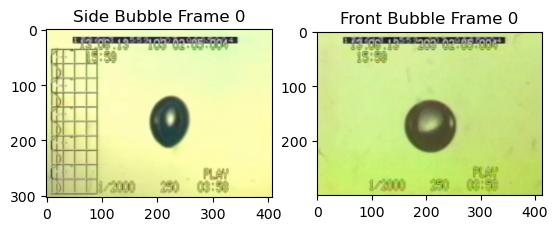

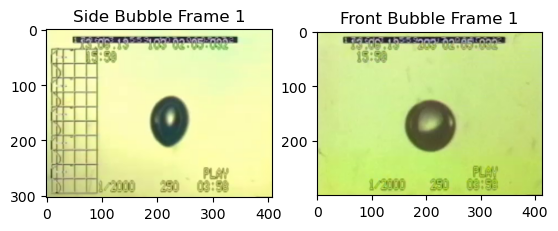

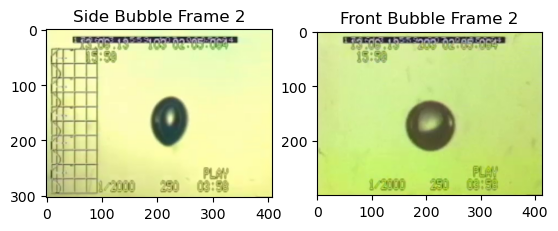

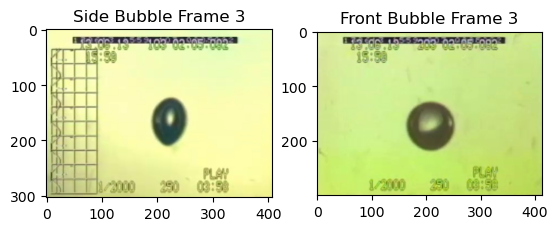

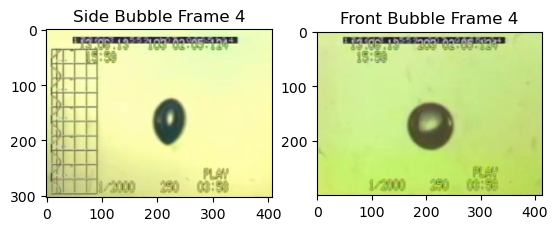

...

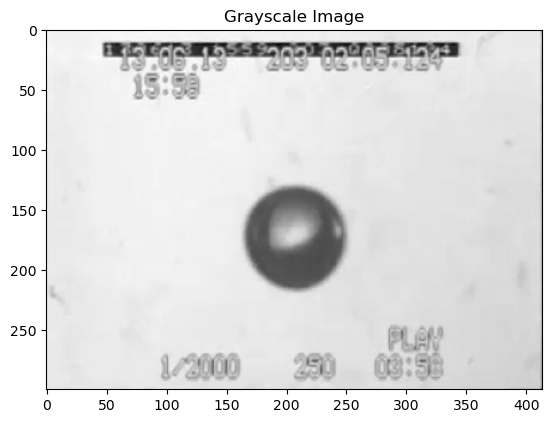

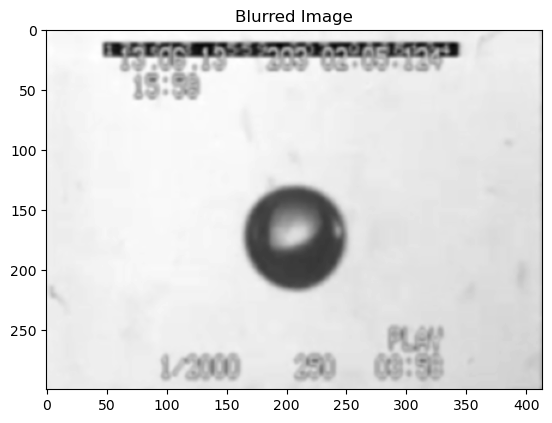

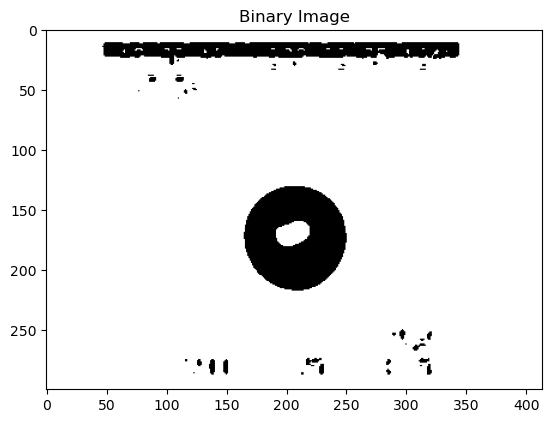

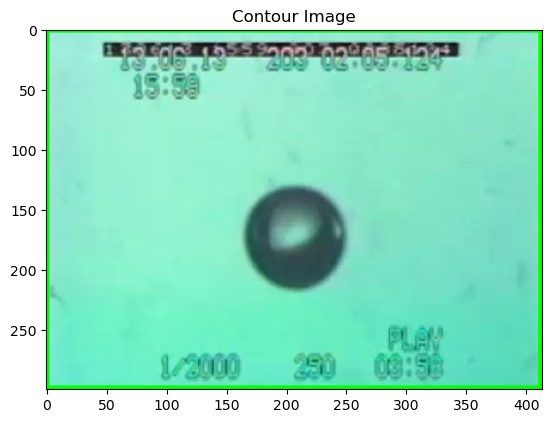

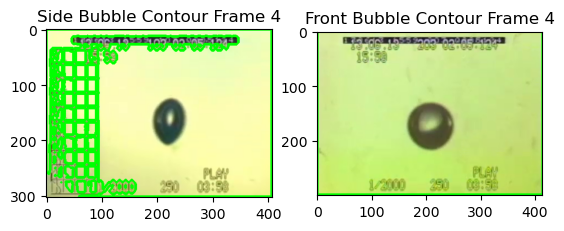

In [11]:
import cv2
import matplotlib.pyplot as plt

def select_roi(frame):
    """
    ユーザーによる手動でのROI選択。

    Args:
    frame: ROIを選択するための画像フレーム。

    Returns:
    選択されたROIの座標のタプル。
    """
    roi_side = cv2.selectROI("Select Side Bubble", frame, False, False)
    roi_front = cv2.selectROI("Select Front Bubble", frame, False, False)
    cv2.destroyAllWindows()
    return roi_side, roi_front

def process_video(video_path, roi_side, roi_front, num_frames=5):
    """
    選択されたROIを使用して動画を処理する。

    Args:
    video_path: 処理する動画ファイルのパス。
    roi_side: 側面の気泡のROI。
    roi_front: 正面の気泡のROI。

    Returns:
    処理されたフレームのリスト。
    """
    # 動画を読み込む
    cap = cv2.VideoCapture(video_path)
    processed_frames = []

    for _ in range(num_frames):
        ret, frame = cap.read()
        if not ret:
            break
        
        # 同じROIを使用して各フレームをクロップする
        side_x, side_y, side_w, side_h = roi_side
        front_x, front_y, front_w, front_h = roi_front
        cropped_side = frame[side_y:side_y+side_h, side_x:side_x+side_w]
        cropped_front = frame[front_y:front_y+front_h, front_x:front_x+front_w]
        
        # 処理されたフレームをリストに追加する
        processed_frames.append((cropped_side, cropped_front))
    # すべてのウィンドウを閉じる
    cap.release()
    return processed_frames

# 処理されたフレームの画像を表示する関数
def show_processed_frames(processed_frames):
    for i, (cropped_side, cropped_front) in enumerate(processed_frames):
        # 側面の気泡画像を表示
        plt.subplot(1, 2, 1)  # 1行2列のグリッドの最初の位置にプロット
        plt.imshow(cv2.cvtColor(cropped_side, cv2.COLOR_BGR2RGB))
        plt.title(f'Side Bubble Frame {i}')

        # 正面の気泡画像を表示
        plt.subplot(1, 2, 2)  # 1行2列のグリッドの2番目の位置にプロット
        plt.imshow(cv2.cvtColor(cropped_front, cv2.COLOR_BGR2RGB))
        plt.title(f'Front Bubble Frame {i}')

        plt.show()
        
def show_step_images(side_image, front_image, step_title):
    """
    画像処理の各ステップの結果を1行2列のグリッドに表示する関数です。

    Args:
    side_image: 側面の気泡画像。
    front_image: 正面の気泡画像。
    step_title: 現在の処理ステップのタイトル。
    """
    plt.figure(figsize=(12, 6))  # 図のサイズを設定

    # 側面の気泡画像を1行2列のグリッドの最初の位置にプロット
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(side_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Side {step_title}')

    # 正面の気泡画像を1行2列のグリッドの2番目の位置にプロット
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(front_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Front {step_title}')

    plt.show()

def detect_and_draw_contours_otsu(image, visualize_steps=True):
    """
    Otsuの方法を用いて自動二値化を行い、輪郭検出を行う関数です。

    Args:
    image: 輪郭検出を行う画像。
    visualize_steps: 各処理ステップの画像を表示するかどうかのフラグ。

    Returns:
    輪郭が描画された画像。
    """
    # グレースケール化
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # ノイズリダクション
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Otsuの方法による自動二値化
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # 輪郭検出
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_image = cv2.drawContours(image.copy(), contours, -1, (0, 255, 0), 3)

    return contour_image

# この関数を呼び出す際には、visualize_steps=True を設定してください。

# 最初のフレームでROIを選択するために動画を読み込む
video_path = 'C:\\Users\\flow\\Desktop\\今さんデータ\\①扁平回転.mp4'
cap = cv2.VideoCapture(video_path)
ret, first_frame = cap.read()
if not ret:
    print("Failed to read the video")
else:
    # ROIを選択
    roi_side, roi_front = select_roi(first_frame)

    # 選択されたROIを使用して動画を処理
    processed_frames = process_video(video_path, roi_side, roi_front)
    print("Processed {} frames".format(len(processed_frames)))
    # print(processed_frames)
    show_processed_frames(processed_frames)
    # 輪郭検出を行い、結果を表示
    for i, (cropped_side, cropped_front) in enumerate(processed_frames):
        contour_side = detect_and_draw_contours_otsu(cropped_side)
        contour_front = detect_and_draw_contours_otsu(cropped_front)

        # 画像処理の各ステップの結果を表示
        show_step_images(contour_side, contour_front, 'Contours')
    

cap.release()
cv2.destroyAllWindows()


Processed 3 frames


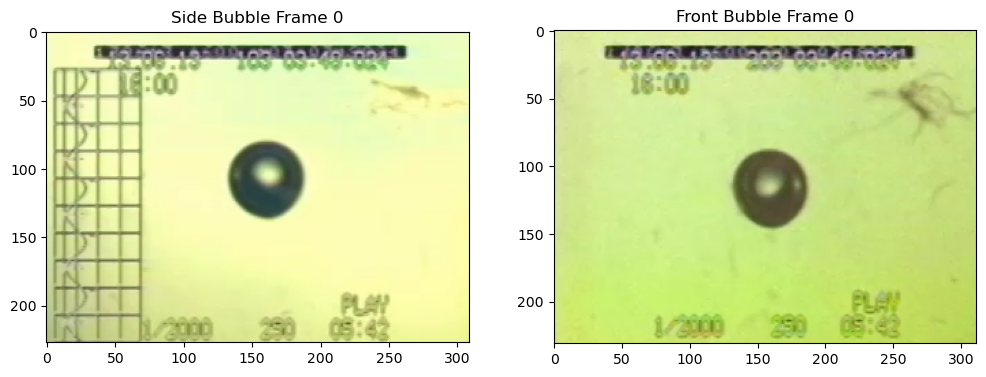

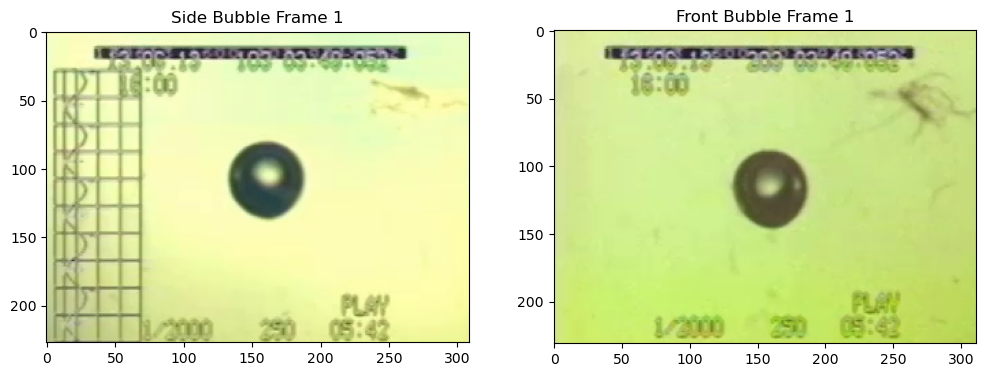

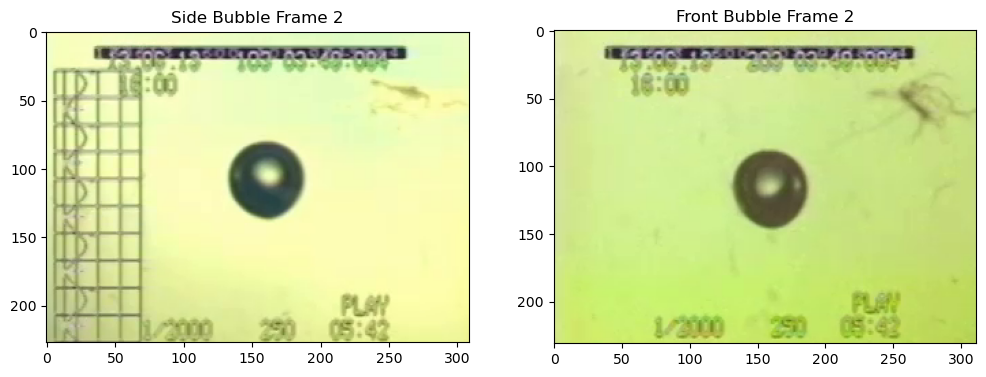

Side Image - Contour #0: Area = 51015.0, Bounding Box = (0, 0, 309, 227)
Side Image - Contour #1: Area = 2640.5, Bounding Box = (132, 79, 58, 60)
Side Image - Contour #2: Area = 356.5, Bounding Box = (215, 191, 36, 18)
Front Image - Contour #0: Area = 71530.0, Bounding Box = (0, 0, 312, 231)
Front Image - Contour #1: Area = 2607.0, Bounding Box = (130, 87, 58, 61)
Front Image - Contour #2: Area = 2597.0, Bounding Box = (36, 10, 231, 17)
Side Image - Contour #0: Circularity = 0.14
Side Image - Contour #1: Circularity = 0.90
Side Image - Contour #2: Circularity = 0.24
Side Image - Max Circularity: 0.90
Front Image - Contour #0: Circularity = 0.77
Front Image - Contour #1: Circularity = 0.89
Front Image - Contour #2: Circularity = 0.13
Front Image - Max Circularity: 0.89
Side Image - Contour Area: 2640.50, Circularity: 0.90
Front Image - Contour Area: 2607.00, Circularity: 0.89


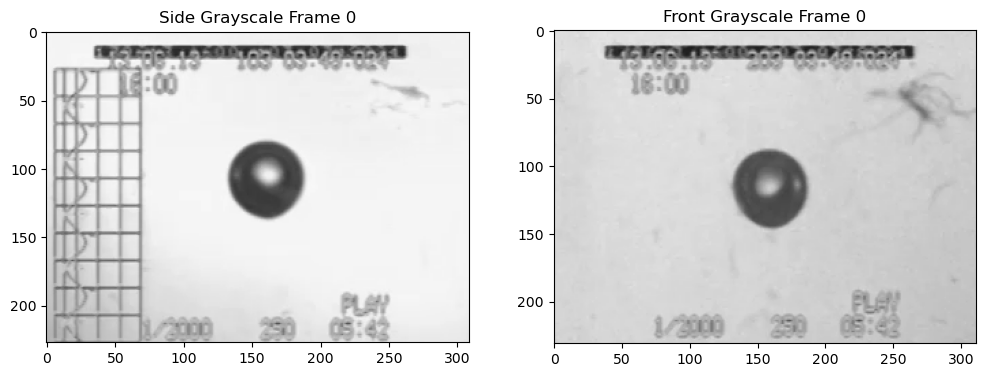

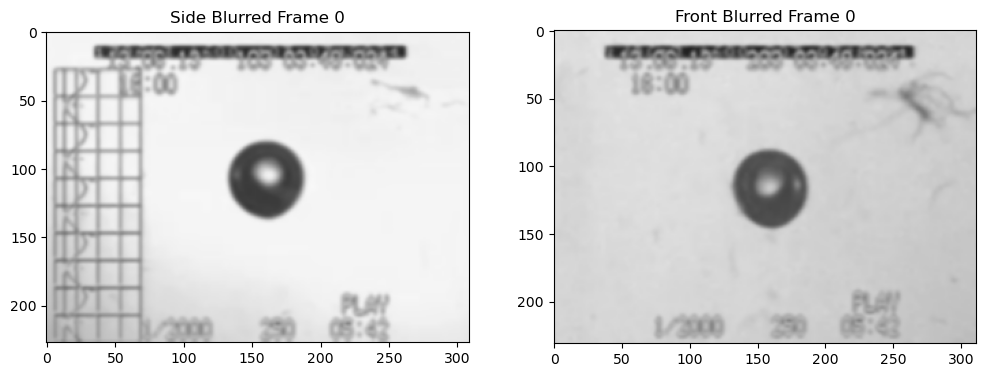

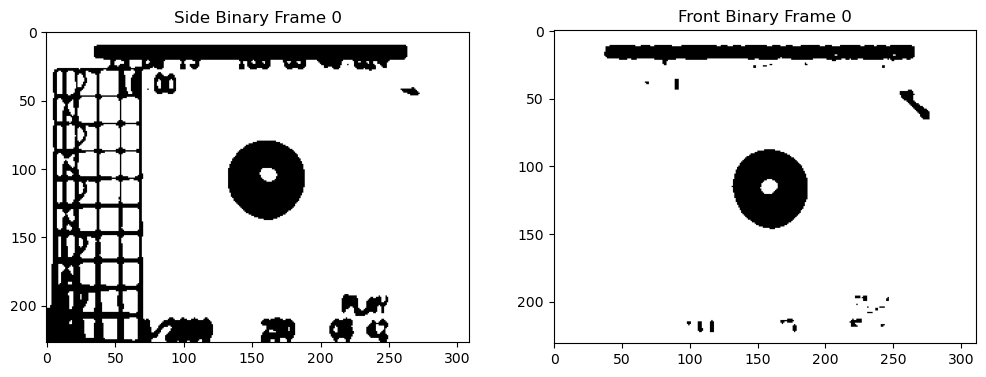

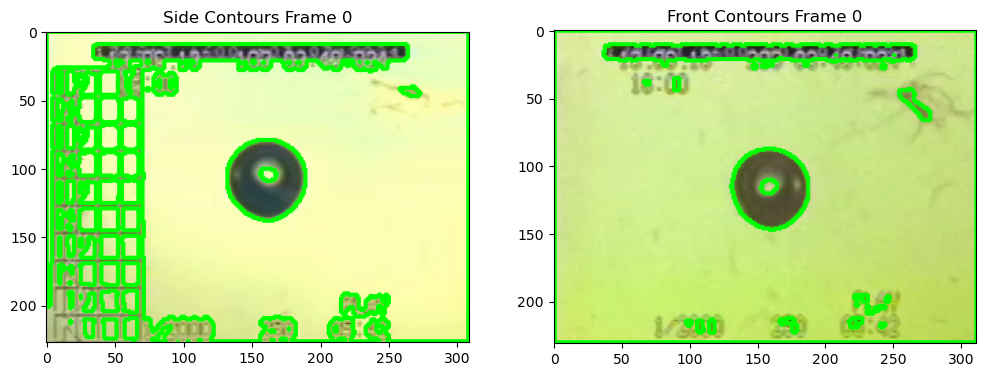

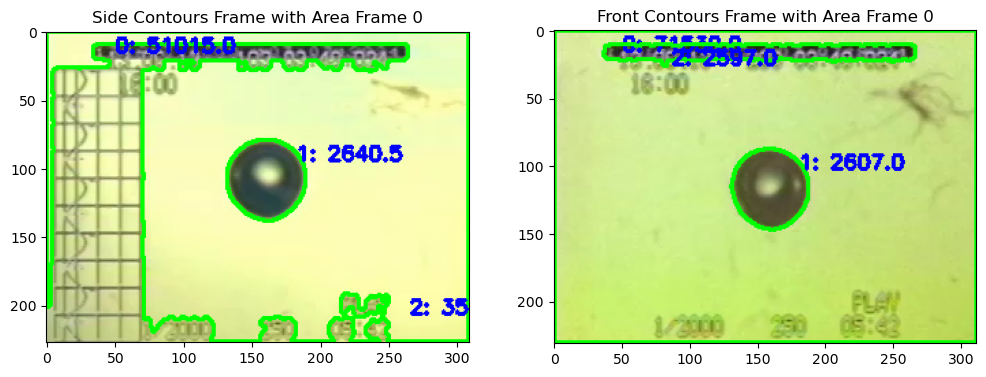

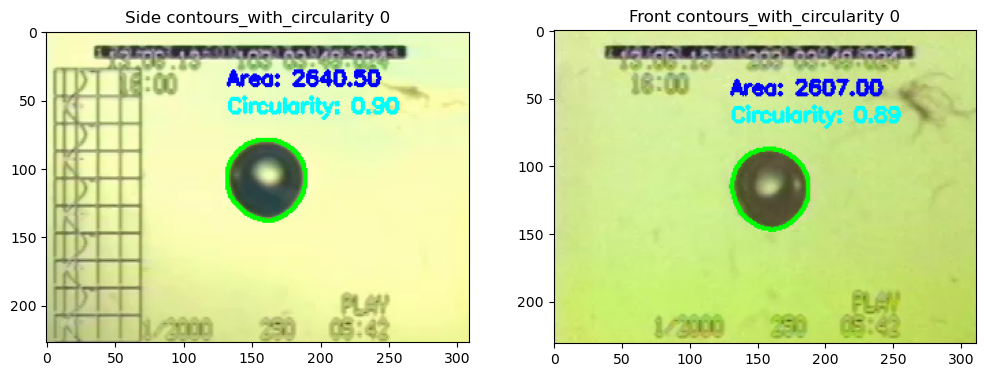

Side Image - Contour #0: Area = 51809.5, Bounding Box = (0, 0, 309, 227)
Side Image - Contour #1: Area = 2620.5, Bounding Box = (132, 79, 58, 60)
Side Image - Contour #2: Area = 704.0, Bounding Box = (55, 30, 13, 77)
Front Image - Contour #0: Area = 71530.0, Bounding Box = (0, 0, 312, 231)
Front Image - Contour #1: Area = 2583.5, Bounding Box = (131, 88, 57, 60)
Front Image - Contour #2: Area = 2501.5, Bounding Box = (36, 11, 231, 17)
Side Image - Contour #0: Circularity = 0.12
Side Image - Contour #1: Circularity = 0.91
Side Image - Contour #2: Circularity = 0.26
Side Image - Max Circularity: 0.91
Front Image - Contour #0: Circularity = 0.77
Front Image - Contour #1: Circularity = 0.90
Front Image - Contour #2: Circularity = 0.12
Front Image - Max Circularity: 0.90
Side Image - Contour Area: 2620.50, Circularity: 0.91
Front Image - Contour Area: 2583.50, Circularity: 0.90


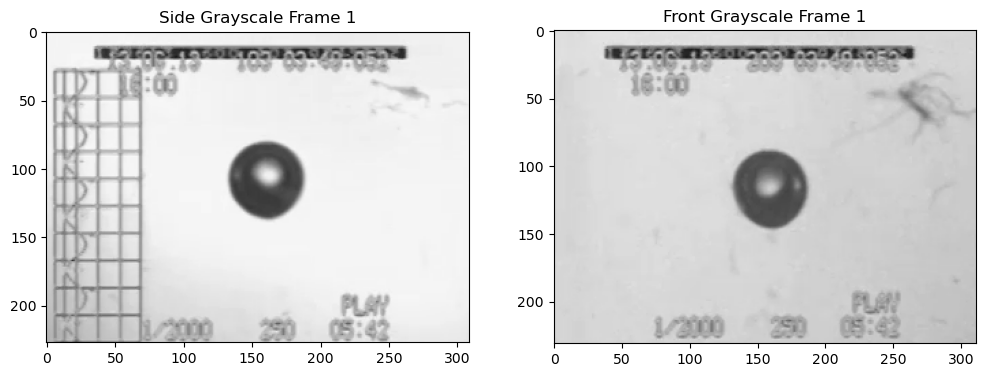

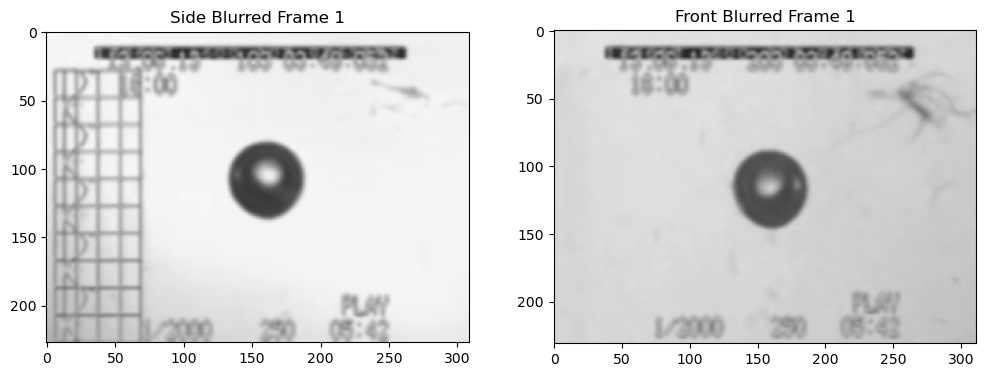

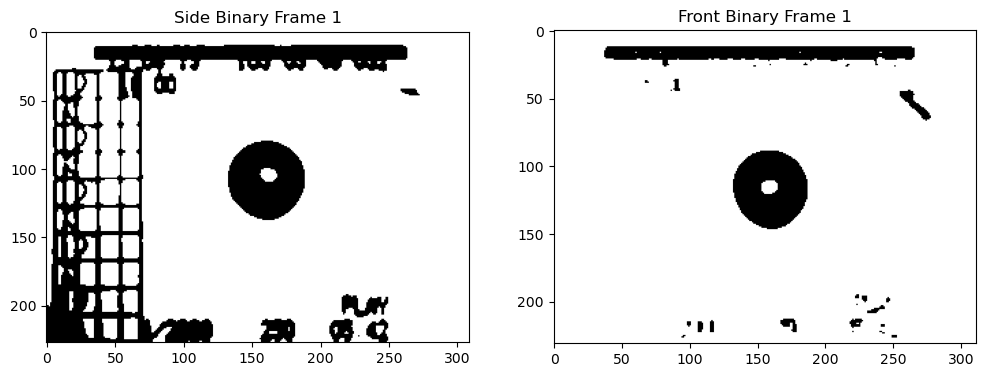

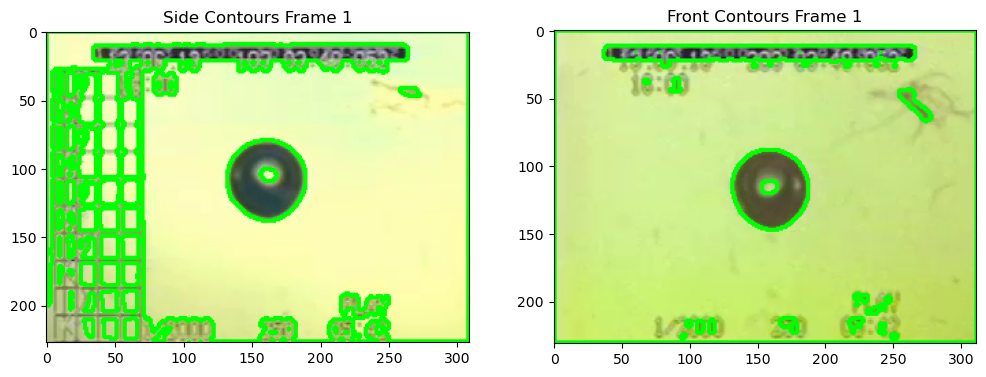

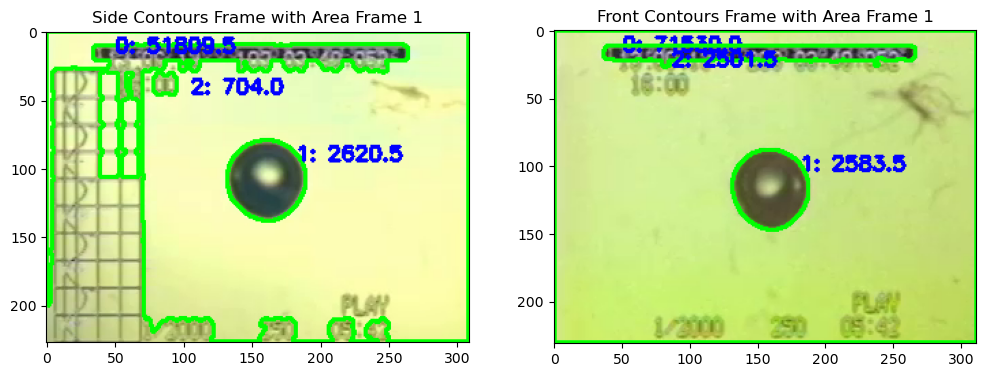

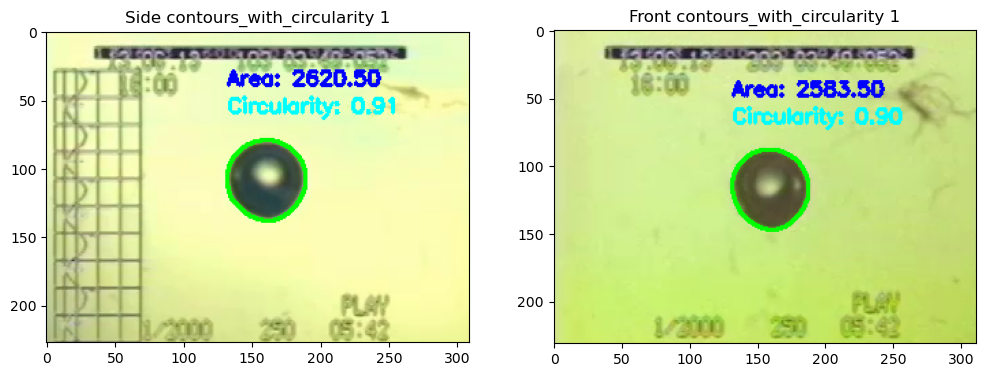

Side Image - Contour #0: Area = 50820.5, Bounding Box = (0, 0, 309, 227)
Side Image - Contour #1: Area = 2628.0, Bounding Box = (132, 79, 58, 60)
Side Image - Contour #2: Area = 1002.5, Bounding Box = (39, 29, 15, 78)
Front Image - Contour #0: Area = 71530.0, Bounding Box = (0, 0, 312, 231)
Front Image - Contour #1: Area = 2592.0, Bounding Box = (131, 88, 57, 60)
Front Image - Contour #2: Area = 2538.5, Bounding Box = (36, 11, 231, 17)
Side Image - Contour #0: Circularity = 0.14
Side Image - Contour #1: Circularity = 0.91
Side Image - Contour #2: Circularity = 0.36
Side Image - Max Circularity: 0.91
Front Image - Contour #0: Circularity = 0.77
Front Image - Contour #1: Circularity = 0.90
Front Image - Contour #2: Circularity = 0.12
Front Image - Max Circularity: 0.90
Side Image - Contour Area: 2628.00, Circularity: 0.91
Front Image - Contour Area: 2592.00, Circularity: 0.90


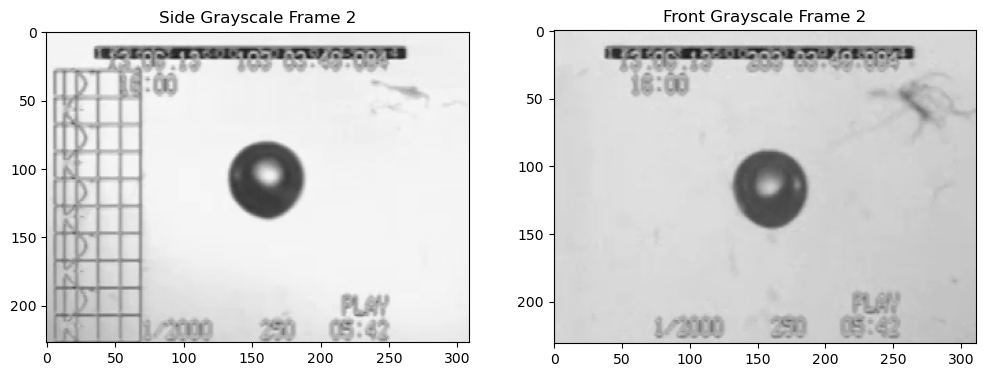

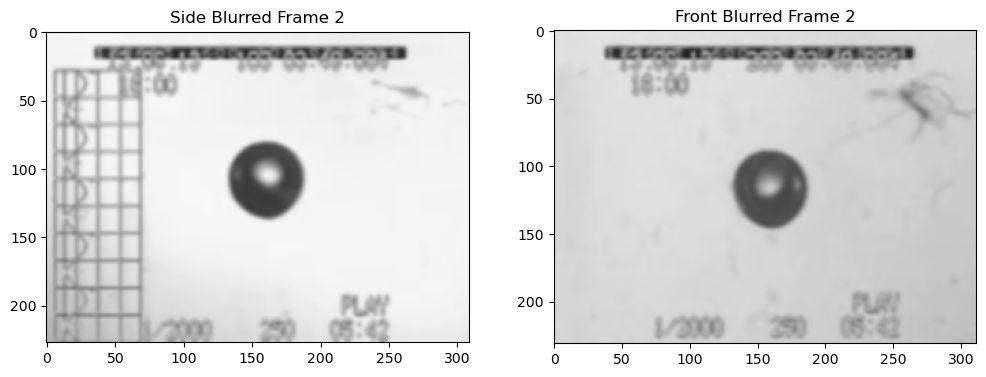

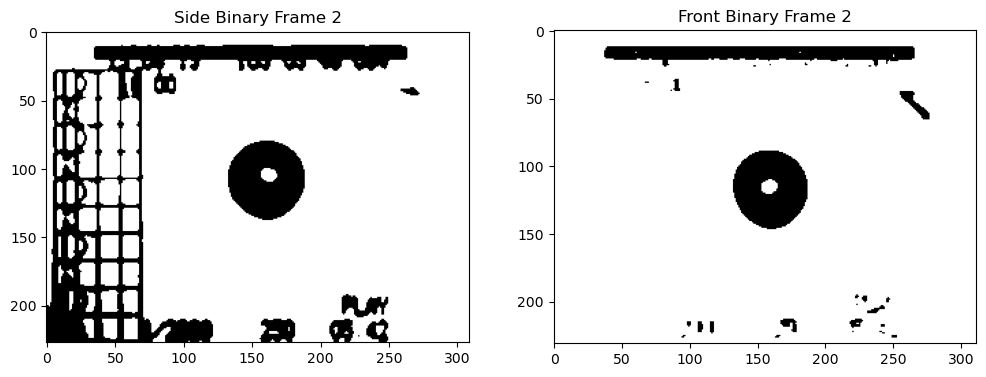

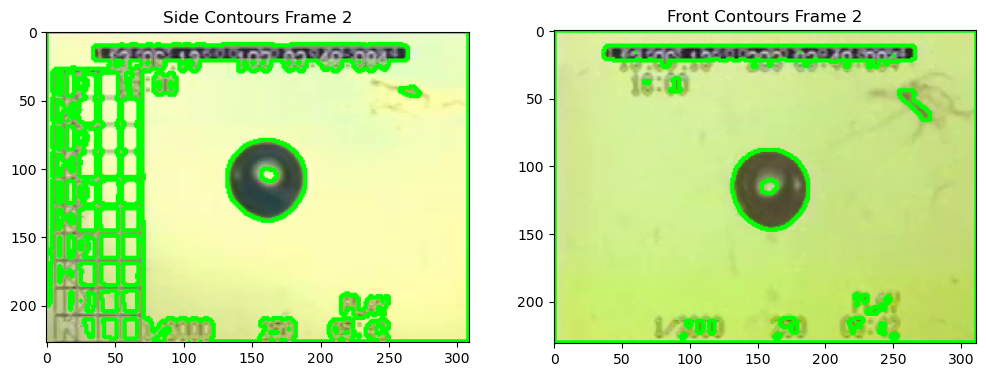

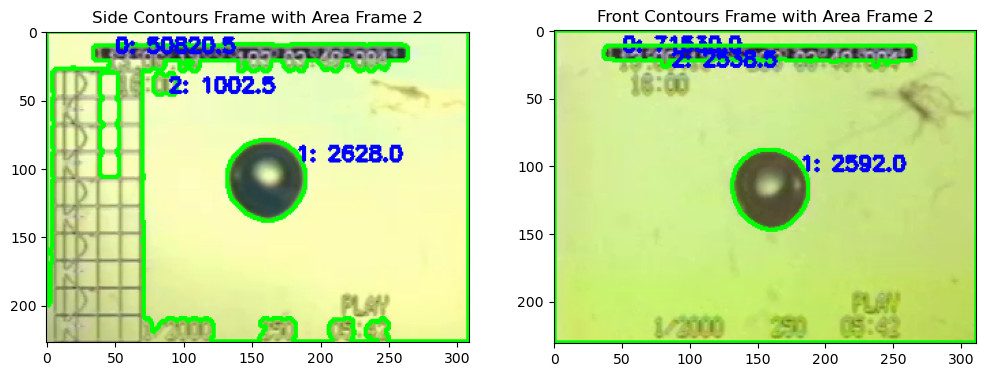

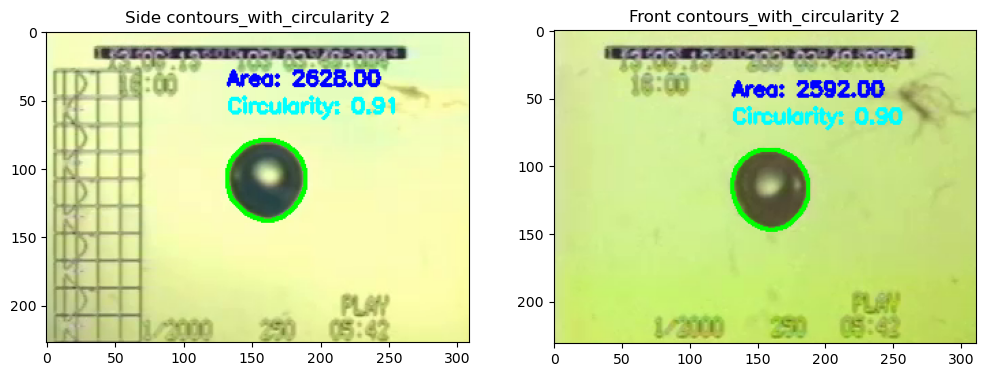

In [41]:

import numpy as np
import cv2
import matplotlib.pyplot as plt
import math


def select_roi(frame):
    """
    ユーザーによる手動でのROI選択。

    Args:
    frame: ROIを選択するための画像フレーム。

    Returns:
    選択されたROIの座標のタプル。
    """
    roi_side = cv2.selectROI("Select Side Bubble", frame, False, False)
    roi_front = cv2.selectROI("Select Front Bubble", frame, False, False)
    cv2.destroyAllWindows()
    return roi_side, roi_front

def process_video(video_path, roi_side, roi_front, num_frames=3):
    """
    選択されたROIを使用して動画を処理する。

    Args:
    video_path: 処理する動画ファイルのパス。
    roi_side: 側面の気泡のROI。
    roi_front: 正面の気泡のROI。

    Returns:
    処理されたフレームのリスト。
    """
    # 動画を読み込む
    cap = cv2.VideoCapture(video_path)
    processed_frames = []

    for _ in range(num_frames):
        ret, frame = cap.read()
        if not ret:
            break
        
        # 同じROIを使用して各フレームをクロップする
        side_x, side_y, side_w, side_h = roi_side
        front_x, front_y, front_w, front_h = roi_front
        cropped_side = frame[side_y:side_y+side_h, side_x:side_x+side_w]
        cropped_front = frame[front_y:front_y+front_h, front_x:front_x+front_w]
        
        # 処理されたフレームをリストに追加する
        processed_frames.append((cropped_side, cropped_front))
    # すべてのウィンドウを閉じる
    cap.release()
    return processed_frames

# 処理されたフレームの画像を表示する関数
def show_processed_frames(processed_frames):
    for i, (cropped_side, cropped_front) in enumerate(processed_frames):
        plt.figure(figsize=(12, 6))  # 図のサイズを設定
        # 側面の気泡画像を表示
        plt.subplot(1, 2, 1)  # 1行2列のグリッドの最初の位置にプロット
        plt.imshow(cv2.cvtColor(cropped_side, cv2.COLOR_BGR2RGB))
        plt.title(f'Side Bubble Frame {i}')

        # 正面の気泡画像を表示
        plt.subplot(1, 2, 2)  # 1行2列のグリッドの2番目の位置にプロット
        plt.imshow(cv2.cvtColor(cropped_front, cv2.COLOR_BGR2RGB))
        plt.title(f'Front Bubble Frame {i}')

        plt.show()

def process_and_visualize_steps(processed_frames, visualize_steps=True):
    """
    動画の各フレームに対して画像処理を行い、必要に応じて処理のステップを可視化します。

    Args:
    processed_frames: 処理するフレームのリスト（側面と正面の画像のペア）。
    visualize_steps: 処理のステップを可視化するかどうか。

    Returns:
    処理されたフレームのリストと各ステップの画像。
    """
    processed_images = []
    for i, (cropped_side, cropped_front) in enumerate(processed_frames):
        steps_images = {}
        # グレースケール化
        side_gray = cv2.cvtColor(cropped_side, cv2.COLOR_BGR2GRAY)
        front_gray = cv2.cvtColor(cropped_front, cv2.COLOR_BGR2GRAY)

        # ノイズリダクション
        side_blurred = cv2.GaussianBlur(side_gray, (5, 5), 0)
        front_blurred = cv2.GaussianBlur(front_gray, (5, 5), 0)

        # 二値化
        _, side_binary = cv2.threshold(side_blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        _, front_binary = cv2.threshold(front_blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # 輪郭検出
        side_contours, _ = cv2.findContours(side_binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
        front_contours, _ = cv2.findContours(front_binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
        
        # 輪郭を描画
        side_contour_image = cv2.drawContours(cropped_side.copy(), side_contours, -1, (0, 255, 0), 2)
        front_contour_image = cv2.drawContours(cropped_front.copy(), front_contours, -1, (0, 255, 0), 2)
        
        # 側面と正面の画像に対して面積フィルタリング関数を適用
        side_processed_image, side_filtered_contours = visualize_contours_with_area(cropped_side.copy(), side_contours, "Side")
        front_processed_image, front_filtered_contours = visualize_contours_with_area(cropped_front.copy(), front_contours, "Front")
        
        # 最も円形度が高い輪郭を特定
        max_side_contour, max_circularity_side = determine_max_circularity(side_filtered_contours, "Side")
        max_front_contour, max_circularity_front = determine_max_circularity(front_filtered_contours, "Front")
        
        
        # 最も円形度が高い輪郭とその面積、円形度を描画
        side_final_image = visualize_max_circularity_contour(cropped_side.copy(), max_side_contour, max_circularity_side, "Side")
        front_final_image = visualize_max_circularity_contour(cropped_front.copy(), max_front_contour, max_circularity_front, "Front")
        
        # 可視化
        if visualize_steps:
            show_step_images(side_gray, front_gray, f'Grayscale Frame {i}')
            show_step_images(side_blurred, front_blurred, f'Blurred Frame {i}')
            show_step_images(side_binary, front_binary, f'Binary Frame {i}')
            show_step_images(side_contour_image, front_contour_image, f'Contours Frame {i}')
            show_step_images(side_processed_image, front_processed_image, f'Contours Frame with Area Frame {i}')
            show_step_images( side_final_image,front_final_image, f'contours_with_circularity {i}')

        # 結果を辞書に格納
        steps_images['Grayscale'] = (side_gray, front_gray)
        steps_images['Blurred'] = (side_blurred, front_blurred)
        steps_images['Binary'] = (side_binary, front_binary)
        steps_images['Contours'] = (side_contour_image, front_contour_image)
        steps_images['Contours Frame with Area Frame'] = (side_processed_image, front_processed_image)
        steps_images['contours_with_circularity'] = ( side_final_image, front_final_image)
        processed_images.append(steps_images)

    return processed_images

def visualize_contours_with_area(image, contours, image_type):
    """
    画像に輪郭とその面積を描画し、コンソールに輪郭の情報を出力します。

    Args:
    image: 輪郭を描画する画像。
    contours: 輪郭のリスト。
    image_type: 画像のタイプ（'Side' または 'Front'）。

    Returns:
    輪郭が描画された画像。
    """
    # 面積計算とソート
    contours_with_area = [(cv2.contourArea(c), c) for c in contours]
    contours_with_area.sort(reverse=True, key=lambda x: x[0])
    filtered_contours = []
    # 番号付けと描画、そしてコンソールへの出力
    for i, (area, contour) in enumerate(contours_with_area):
        if i < 3:  # 最大面積の輪郭から3個を表示
            # 輪郭のバウンディングボックスを取得
            x, y, w, h = cv2.boundingRect(contour)
            cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)
            
            # テキストの描画位置（バウンディングボックスの上部）
            text_position = (x+50, y+15)
            text = f"{i}: {area}"
            cv2.putText(image, text, text_position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
            print(f"{image_type} Image - Contour #{i}: Area = {area}, Bounding Box = ({x}, {y}, {w}, {h})")
            filtered_contours.append(contour)
            
    return image,filtered_contours

def calculate_circularity(contour):
    area = cv2.contourArea(contour)
    perimeter = cv2.arcLength(contour, True)
    if perimeter == 0:
        return 0
    circularity = 4 * np.pi * (area / (perimeter ** 2))
    return circularity

def determine_max_circularity(contours, image_type):
    """
    与えられた輪郭の中で最も円形度が高いものを選択し、その円形度を出力する。

    Args:
    contours: 輪郭のリスト。
    image_type: 輪郭のタイプ（'Side' または 'Front'）。

    Returns:
    最も円形度が高い輪郭とその円形度。
    """
    # 各輪郭の円形度を計算
    circularity_contours = [(calculate_circularity(c), c) for c in contours]

    # 円形度のリストのみを抽出
    circularities = [c[0] for c in circularity_contours]

    # 各輪郭の円形度とタイプを出力
    for i, circularity in enumerate(circularities):
        print(f"{image_type} Image - Contour #{i}: Circularity = {circularity:.2f}")

    # 円形度が最大の輪郭を見つける
    max_circularity, max_contour = max(circularity_contours, key=lambda x: x[0])

    # 最大の円形度を持つ輪郭の情報を出力
    print(f"{image_type} Image - Max Circularity: {max_circularity:.2f}")

    return max_contour, max_circularity

def visualize_max_circularity_contour(image, contour, circularity, image_type):
    """
    画像に最も円形度が高い輪郭とその面積、円形度を描画します。

    Args:
    image: 輪郭を描画する画像。
    contour: 最も円形度が高い輪郭。
    circularity: 輪郭の円形度。
    image_type: 画像のタイプ（'Side' または 'Front'）。

    Returns:
    更新された画像。
    """
    # 輪郭の面積を計算
    area = cv2.contourArea(contour)

    # 輪郭のバウンディングボックスを取得
    x, y, w, h = cv2.boundingRect(contour)

    # 輪郭を画像に描画
    cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)

    # 面積と円形度の情報をテキストとして描画
    text1 = f"Area: {area:.2f}"
    text2 = f"Circularity: {circularity:.2f}"
    cv2.putText(image, text1, (x, y - 40), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    cv2.putText(image, text2, (x, y - 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0), 2)
    # 輪郭の情報を出力
    print(f"{image_type} Image - Contour Area: {area:.2f}, Circularity: {circularity:.2f}")

    return image


def show_step_images(side_image, front_image, step_title):
    """
    画像処理の各ステップの結果を1行2列のグリッドに表示する関数です。

    Args:
    side_image: 側面の気泡画像。
    front_image: 正面の気泡画像。
    step_title: 現在の処理ステップのタイトル。
    """
    plt.figure(figsize=(12, 6))  # 図のサイズを設定

    # 側面の気泡画像を1行2列のグリッドの最初の位置にプロット
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(side_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Side {step_title}')

    # 正面の気泡画像を1行2列のグリッドの2番目の位置にプロット
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(front_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Front {step_title}')

    plt.show()
    
    
# 最初のフレームでROIを選択するために動画を読み込む
video_path = 'C:\\Users\\flow\\Desktop\\今さんデータ\\②球形で膨張・収縮.mp4'
cap = cv2.VideoCapture(video_path)
ret, first_frame = cap.read()
if not ret:
    print("Failed to read the video")
else:
    # ROIを選択する
    roi_side, roi_front = select_roi(first_frame)

    # 選択されたROIを使用して動画を処理
    processed_frames = process_video(video_path, roi_side, roi_front)
    print("Processed {} frames".format(len(processed_frames)))
    # print(processed_frames)
    show_processed_frames(processed_frames)  
    process_and_visualize_steps(processed_frames, visualize_steps=True)
